In [388]:
import hyperspy.api as hs
import numpy as np

StackIn = hs.load('3D Stack align2.dm3')

print("Type:", type(StackIn))
print("Signal type:", getattr(StackIn, "signal_type", None))
print("Data shape:", StackIn.data.shape)



Type: <class 'hyperspy._signals.signal2d.Signal2D'>
Signal type: None
Data shape: (10, 1024, 1024)


nIm shape: (10, 1024, 1024)
Per-frame min: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Per-frame max: [1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


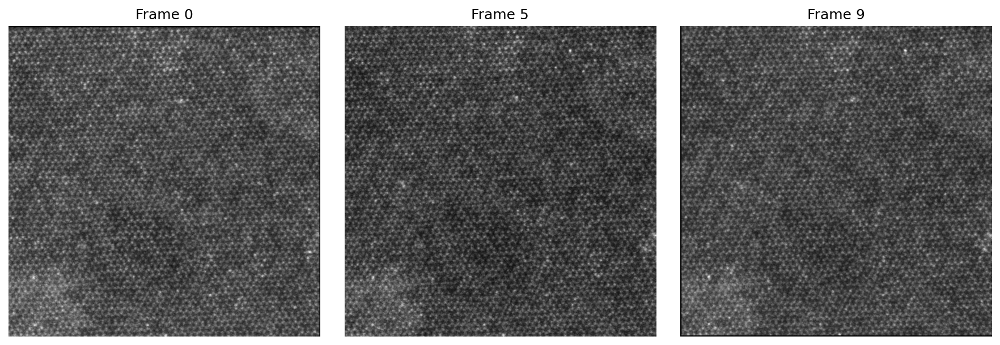

In [389]:
import numpy as np
from scipy import ndimage
import matplotlib.pyplot as plt

data = StackIn.data.astype(np.float32)   # (10, 1024, 1024)

# Optional smoothing (no smoothing across time)
sigma = 1.0
data_s = ndimage.gaussian_filter(data, sigma=(0, sigma, sigma))

# Normalize each frame independently to [0, 1]
eps = 1e-12
mins = data_s.min(axis=(1,2), keepdims=True)
ptps = np.ptp(data_s, axis=(1,2), keepdims=True)
nIm = (data_s - mins) / (ptps + eps)

print("nIm shape:", nIm.shape)
print("Per-frame min:", nIm.min(axis=(1,2)))
print("Per-frame max:", nIm.max(axis=(1,2)))

# Show three frames
frames_to_show = [0, 5, 9]
fig, axs = plt.subplots(1, len(frames_to_show), figsize=(12,4), dpi=150)
for ax, t in zip(axs, frames_to_show):
    ax.imshow(nIm[t], cmap="gray")
    ax.set_title(f"Frame {t}")
    ax.axis("off")
plt.tight_layout()
plt.show()


The folowing step extracts and normalizes overlapping local image patches from the STEM time series and prepares them for self-supervised learning, allowing the network to learn common local atomic-scale features without labels.

Detected atom candidates: 8216


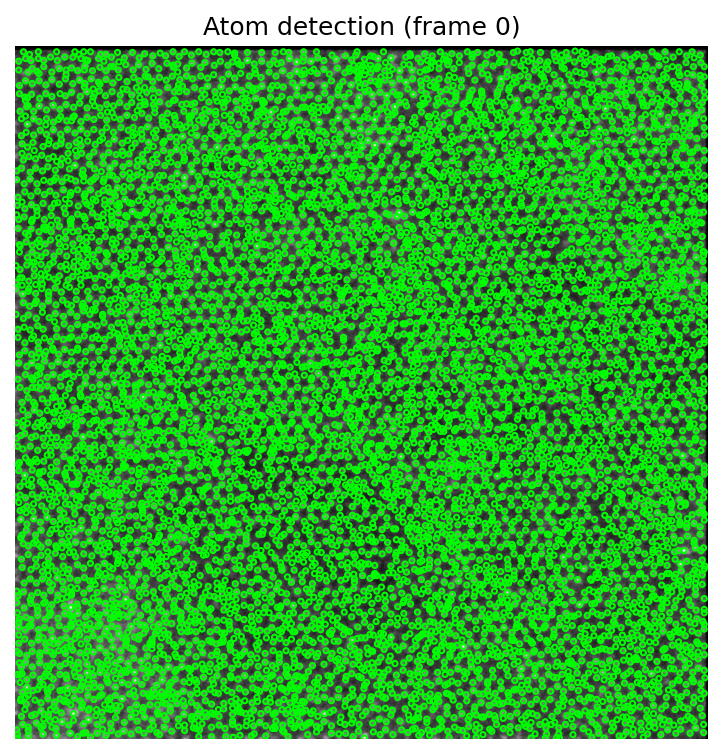

Atom patches: (80510, 16, 16) meta: (80510, 3)
X tensor: torch.Size([80510, 1, 16, 16])
DataLoader ready. batches per epoch: 628


In [390]:
import numpy as np
import torch
from torch.utils.data import DataLoader, TensorDataset
from scipy import ndimage
from skimage.feature import peak_local_max as MaxPeak
import matplotlib.pyplot as plt

# ----------------------------
# Parameters (tune these first)
# ----------------------------
t_ref = 0                 # reference frame for atom detection
atom_patch = 16           # RECOMMENDED: 16 or 32 (divisible by 4 avoids shape issues)
half = atom_patch // 2

min_dist = 1              # pixels; tune 4–10 based on lattice spacing
peak_thr_rel = 0.1       # tune 0.15–0.40
max_peaks = 12000         # safety cap

max_atoms = 10000          # cap for speed; adjust 3000–10000
batch_size = 128          # adjust for your machine (CPU: 64–128; GPU: 256)

# ----------------------------
# Detect atoms in reference frame
# ----------------------------
T, H, W = nIm.shape
img0 = nIm[t_ref].astype(np.float32)

# light smoothing helps peak detection
imgf = ndimage.gaussian_filter(img0, sigma=1.0)

coords = MaxPeak(
    imgf,
    min_distance=min_dist,
    threshold_rel=peak_thr_rel,
    num_peaks=max_peaks
)  # (N,2) rows, cols

print("Detected atom candidates:", coords.shape[0])

# Optional: randomly subsample atoms for speed
if coords.shape[0] > max_atoms:
    rng = np.random.default_rng(0)
    idx = rng.choice(coords.shape[0], size=max_atoms, replace=False)
    coords = coords[idx]
    print("Subsampled atoms to:", coords.shape[0])

# visualize detection
plt.figure(figsize=(6,6), dpi=150)
plt.imshow(img0, cmap="gray")
plt.scatter(coords[:,1], coords[:,0], s=6, facecolors="none", edgecolors="lime")
plt.title(f"Atom detection (frame {t_ref})")
plt.axis("off")
plt.show()

# ----------------------------
# Extract atom-centered patches across all frames
# ----------------------------
patches = []
meta = []  # (t, r_center, c_center)

for t in range(T):
    img = nIm[t].astype(np.float32)
    for (r, c) in coords:
        r = int(r); c = int(c)
        if r-half < 0 or r+half >= H or c-half < 0 or c+half >= W:
            continue
        p = img[r-half:r+half, c-half:c+half]   # shape (atom_patch, atom_patch)
        patches.append(p)
        meta.append((t, r, c))

patches = np.stack(patches, axis=0).astype(np.float32)  # (N_total, atom_patch, atom_patch)
meta = np.array(meta, dtype=int)

print("Atom patches:", patches.shape, "meta:", meta.shape)

# ----------------------------
# Per-patch normalization
# ----------------------------
eps = 1e-6
p_mean = patches.mean(axis=(1,2), keepdims=True)
p_std  = patches.std(axis=(1,2), keepdims=True)
patches_n = (patches - p_mean) / (p_std + eps)

# ----------------------------
# Torch tensors + DataLoader
# ----------------------------
X = torch.tensor(patches_n[:, None, :, :], dtype=torch.float32)  # (N,1,atom_patch,atom_patch)

print("X tensor:", X.shape)

ds = TensorDataset(X, X)  # autoencoder target = input
loader = DataLoader(ds, batch_size=batch_size, shuffle=True, drop_last=True)

print("DataLoader ready. batches per epoch:", len(loader))


In [391]:
import torch
import torch.nn as nn
import torch.optim as optim

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

class AtomicCAE(nn.Module):
    """
    Small convolutional autoencoder for atom-centered patches.
    Returns:
      y : reconstructed patch
      z : latent feature map (used for clustering)
    """
    def __init__(self):
        super().__init__()
        # Encoder
        self.enc = nn.Sequential(
            nn.Conv2d(1, 16, 3, padding=1), nn.ReLU(),
            nn.MaxPool2d(2),               # /2
            nn.Conv2d(16, 32, 3, padding=1), nn.ReLU(),
            nn.MaxPool2d(2),               # /4
        )
        # Decoder
        self.dec = nn.Sequential(
            nn.Upsample(scale_factor=2, mode="nearest"),
            nn.Conv2d(32, 16, 3, padding=1), nn.ReLU(),
            nn.Upsample(scale_factor=2, mode="nearest"),
            nn.Conv2d(16, 1, 3, padding=1),
        )

    def forward(self, x):
        z = self.enc(x)
        y = self.dec(z)
        # safety crop in case of odd sizes
        y = y[:, :, :x.shape[2], :x.shape[3]]
        return y, z

model = AtomicCAE().to(device)
opt = optim.Adam(model.parameters(), lr=1e-3)
loss_fn = nn.MSELoss()

print("Model parameters:", sum(p.numel() for p in model.parameters())/1e6, "M")


Device: cpu
Model parameters: 0.009569 M


In [392]:
import numpy as np

model.train()
epochs = 15   # start with 10–15; increase only if needed

for ep in range(1, epochs + 1):
    losses = []
    for xb, yb in loader:
        xb = xb.to(device)
        yb = yb.to(device)

        opt.zero_grad()
        yhat, _ = model(xb)
        loss = loss_fn(yhat, yb)
        loss.backward()
        opt.step()

        losses.append(loss.item())

    print(f"Epoch {ep}/{epochs}  loss={float(np.mean(losses)):.6f}")


Epoch 1/15  loss=0.105166
Epoch 2/15  loss=0.043688
Epoch 3/15  loss=0.035564
Epoch 4/15  loss=0.031540
Epoch 5/15  loss=0.029139
Epoch 6/15  loss=0.027406
Epoch 7/15  loss=0.026093
Epoch 8/15  loss=0.025089
Epoch 9/15  loss=0.024242
Epoch 10/15  loss=0.023532
Epoch 11/15  loss=0.022950
Epoch 12/15  loss=0.022367
Epoch 13/15  loss=0.021959
Epoch 14/15  loss=0.021533
Epoch 15/15  loss=0.021151


Extract latent vectors for all atom patches (batched, fast)

In [393]:
import numpy as np
import torch

model.eval()
latents = []

with torch.no_grad():
    for i in range(0, X.shape[0], 512):  # batch inference
        xb = X[i:i+512].to(device)
        _, z = model(xb)                 # z: (B, C, h, w)
        # compress spatial dims -> vector per atom
        z_vec = z.mean(dim=(2,3))        # Global Average Pooling
        latents.append(z_vec.cpu().numpy())

Z = np.vstack(latents)                   # (N_atoms_total, latent_dim)
print("Latent matrix Z:", Z.shape)


Latent matrix Z: (80510, 32)


In [394]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

# Standardize latent features
Zs = StandardScaler().fit_transform(Z)

# Optional but recommended: reduce noise and speed up clustering
Zp = PCA(n_components=10, random_state=0).fit_transform(Zs)

# Choose number of atomic feature types
K_feat = 3   # try 3–6
kmeans = KMeans(n_clusters=K_feat, random_state=0, n_init="auto")
labels = kmeans.fit_predict(Zp)

print("Atomic feature cluster counts:", np.bincount(labels))


Atomic feature cluster counts: [29491 32888 18131]


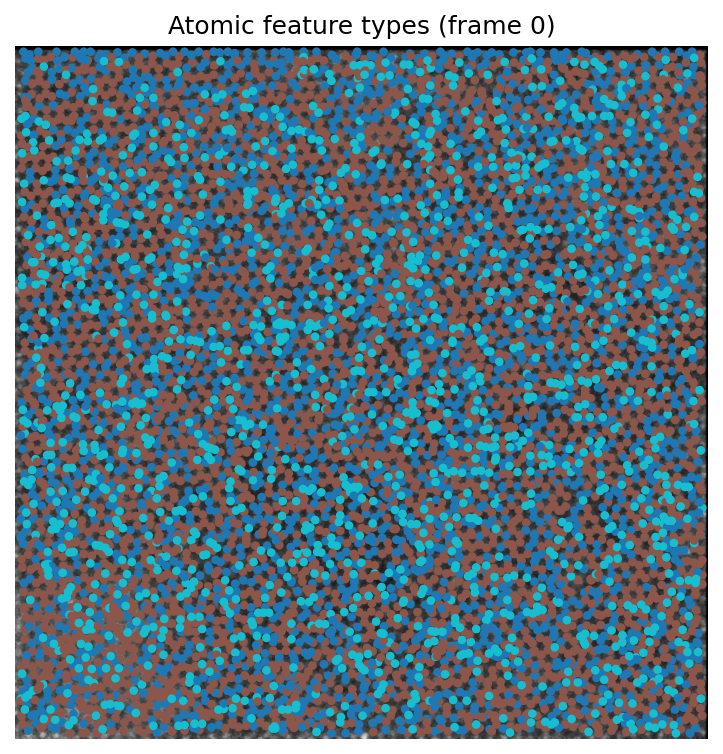

In [395]:
import matplotlib.pyplot as plt

def plot_atomic_features(frame=0, s=10):
    sel = (meta[:,0] == frame)
    xy = meta[sel][:, [2,1]]   # (x=col, y=row)
    lab = labels[sel]

    plt.figure(figsize=(6,6), dpi=150)
    plt.imshow(nIm[frame], cmap="gray")
    plt.scatter(xy[:,0], xy[:,1], c=lab, cmap="tab10", s=s)
    plt.title(f"Atomic feature types (frame {frame})")
    plt.axis("off")
    plt.show()

plot_atomic_features(frame=0)


In [396]:
import numpy as np

# meta: (t, r, c)
# labels: feature label per atom-patch

# build unique atom keys from (r,c)
atom_keys = [(int(r), int(c)) for (_, r, c) in meta]
unique_atoms = sorted(set(atom_keys))
atom_id = {k:i for i,k in enumerate(unique_atoms)}

T = nIm.shape[0]
K = labels.max() + 1

# L[t, atom] = feature label at time t (or -1 if missing)
L = -np.ones((T, len(unique_atoms)), dtype=int)

for i, (t, r, c) in enumerate(meta):
    aid = atom_id[(int(r), int(c))]
    L[int(t), aid] = labels[i]

print("Feature table shape:", L.shape)


Feature table shape: (10, 8051)


In [397]:
# count feature changes per atom
changes = []
for a in range(L.shape[1]):
    seq = L[:,a]
    seq = seq[seq >= 0]
    if len(seq) < 2:
        continue
    changes.append(np.sum(seq[1:] != seq[:-1]))

changes = np.array(changes)

print("Atoms analyzed:", len(changes))
print("Mean feature changes per atom:", changes.mean())
print("Fraction of atoms that changed at least once:", np.mean(changes > 0))


Atoms analyzed: 8051
Mean feature changes per atom: 3.073531238355484
Fraction of atoms that changed at least once: 0.8172897776673705


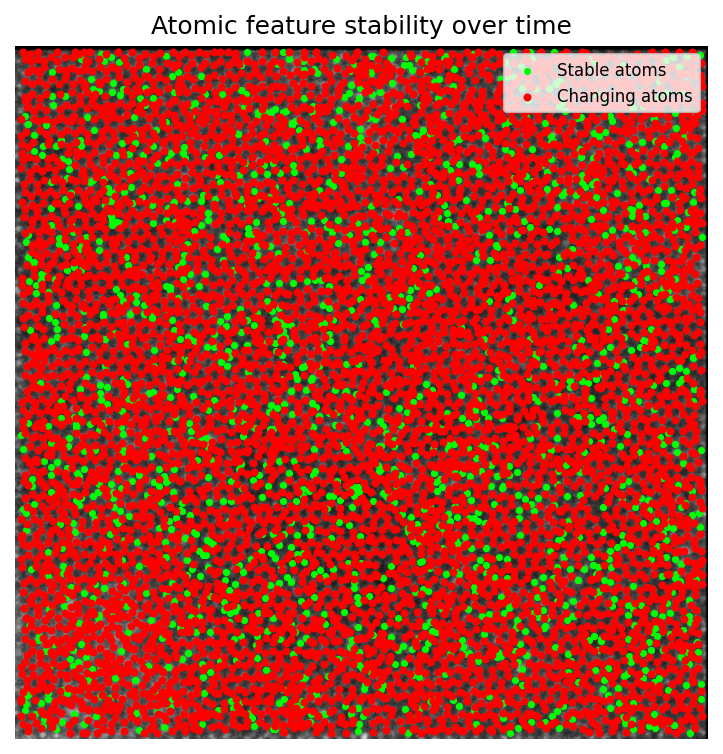

In [398]:
# atoms that ever changed feature
changing_atoms = np.zeros(len(unique_atoms), dtype=bool)

for a in range(L.shape[1]):
    seq = L[:,a]
    seq = seq[seq >= 0]
    if len(seq) >= 2 and np.any(seq[1:] != seq[:-1]):
        changing_atoms[a] = True

# plot
import matplotlib.pyplot as plt

plt.figure(figsize=(6,6), dpi=150)
plt.imshow(nIm[0], cmap="gray")

xy = np.array(unique_atoms)
plt.scatter(
    xy[~changing_atoms,1], xy[~changing_atoms,0],
    s=6, c="lime", label="Stable atoms"
)
plt.scatter(
    xy[changing_atoms,1], xy[changing_atoms,0],
    s=8, c="red", label="Changing atoms"
)

plt.legend(loc="upper right", fontsize=8)
plt.title("Atomic feature stability over time")
plt.axis("off")
plt.show()


In [399]:
import numpy as np

# Count number of feature changes per atom
change_counts = np.zeros(L.shape[1], dtype=int)

for a in range(L.shape[1]):
    seq = L[:, a]
    seq = seq[seq >= 0]   # remove missing
    if len(seq) < 2:
        continue
    change_counts[a] = np.sum(seq[1:] != seq[:-1])

# Atom with maximum changes
a_max = np.argmax(change_counts)

print("Max number of changes:", change_counts[a_max])
print("Atom index:", a_max)

# Atom coordinates
r0, c0 = unique_atoms[a_max]
print("Atom location (row, col):", r0, c0)


Max number of changes: 9
Atom index: 68
Atom location (row, col): 14 881


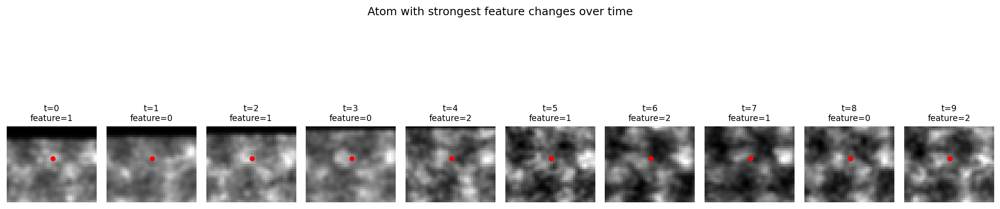

In [400]:
import matplotlib.pyplot as plt

zoom = 20  # pixels around atom; adjust if needed

plt.figure(figsize=(15, 4), dpi=150)

for t in range(T):
    plt.subplot(1, T, t+1)

    img = nIm[t]
    r, c = r0, c0

    # crop with bounds checking
    r1 = max(0, r - zoom)
    r2 = min(img.shape[0], r + zoom)
    c1 = max(0, c - zoom)
    c2 = min(img.shape[1], c + zoom)

    plt.imshow(img[r1:r2, c1:c2], cmap="gray")
    plt.scatter(c - c1, r - r1, c="red", s=20)

    lab = L[t, a_max]
    if lab >= 0:
        plt.title(f"t={t}\nfeature={lab}", fontsize=9)
    else:
        plt.title(f"t={t}\nmissing", fontsize=9)

    plt.axis("off")

plt.suptitle("Atom with strongest feature changes over time", y=1.05)
plt.tight_layout()
plt.show()


In [401]:
from matplotlib import animation
import matplotlib.pyplot as plt
import numpy as np

# Atom location
r0, c0 = unique_atoms[a_max]
zoom = 20
n_interp = 5   # number of interpolated frames between real frames

# Prepare crops for all frames first (clean + fast)
crops = []
labels_seq = []

for t in range(T):
    img = nIm[t]
    r1 = max(0, r0 - zoom); r2 = min(img.shape[0], r0 + zoom)
    c1 = max(0, c0 - zoom); c2 = min(img.shape[1], c0 + zoom)
    crops.append(img[r1:r2, c1:c2])
    labels_seq.append(L[t, a_max])

# Build interpolated sequence
frames = []
frame_labels = []

for t in range(T - 1):
    A = crops[t]
    B = crops[t + 1]
    for k in range(n_interp):
        alpha = k / n_interp
        frames.append((1 - alpha) * A + alpha * B)
        frame_labels.append(f"t={t} → {t+1} | feature {labels_seq[t]}")
# append final frame
frames.append(crops[-1])
frame_labels.append(f"t={T-1} | feature {labels_seq[-1]}")

# Create animation
fig, ax = plt.subplots(figsize=(4,4), dpi=150)
im = ax.imshow(frames[0], cmap="gray")
pt = ax.scatter([zoom], [zoom], c="red", s=25)
title = ax.set_title("")
ax.axis("off")

def update(i):
    im.set_data(frames[i])
    title.set_text(frame_labels[i])
    return im, pt, title

anim = animation.FuncAnimation(
    fig,
    update,
    frames=len(frames),
    interval=120,
    blit=False
)

anim.save("most_changing_atom_smooth.gif", writer="pillow", fps=8)
plt.close(fig)

print("Saved most_changing_atom_smooth.gif")


Saved most_changing_atom_smooth.gif


In [402]:
from matplotlib import animation
import matplotlib.pyplot as plt
import numpy as np

# ----------------------------
# Parameters
# ----------------------------
r0, c0 = unique_atoms[a_max]   # central atom
zoom = 20                      # image crop half-size
neighbor_radius = 18           # pixels; controls how many neighbors
n_interp = 5                   # smooth interpolation steps

# ----------------------------
# Precompute crops and atom neighbors
# ----------------------------
crops = []
labels_seq = []

for t in range(T):
    img = nIm[t]
    r1 = max(0, r0 - zoom); r2 = min(img.shape[0], r0 + zoom)
    c1 = max(0, c0 - zoom); c2 = min(img.shape[1], c0 + zoom)
    crops.append(img[r1:r2, c1:c2])
    labels_seq.append(L[t, a_max])

# find neighboring atoms once (geometry does not change)
xy = np.array(unique_atoms)  # (N_atoms, 2) rows, cols
dist = np.sqrt((xy[:,0]-r0)**2 + (xy[:,1]-c0)**2)
neighbors = np.where(dist <= neighbor_radius)[0]

print("Number of surrounding atoms:", len(neighbors))

# ----------------------------
# Build interpolated image frames
# ----------------------------
frames = []
frame_info = []  # (t, alpha)

for t in range(T - 1):
    A = crops[t]
    B = crops[t + 1]
    for k in range(n_interp):
        alpha = k / n_interp
        frames.append((1 - alpha) * A + alpha * B)
        frame_info.append((t, alpha))
frames.append(crops[-1])
frame_info.append((T-1, 1.0))

# ----------------------------
# Create animation
# ----------------------------
fig, ax = plt.subplots(figsize=(4,4), dpi=150)

im = ax.imshow(frames[0], cmap="gray")

# central atom marker
pt_center = ax.scatter([zoom], [zoom], c="red", s=30, edgecolors="black", zorder=3)

# surrounding atoms (initialized empty)
scat = ax.scatter([], [], c=[], cmap="tab10", s=18, zorder=3)

title = ax.set_title("")
ax.axis("off")

def update(i):
    im.set_data(frames[i])

    # determine which real frame this interpolated frame belongs to
    t, _ = frame_info[i]

    # collect neighbor atom positions and labels for frame t
    xs, ys, cols = [], [], []
    for a in neighbors:
        lab = L[t, a]
        if lab < 0:
            continue
        rr, cc = unique_atoms[a]

        # only plot if inside crop
        if abs(rr - r0) <= zoom and abs(cc - c0) <= zoom:
            ys.append(rr - (r0 - zoom))
            xs.append(cc - (c0 - zoom))
            cols.append(lab)

    if len(xs) > 0:
        scat.set_offsets(np.c_[xs, ys])
        scat.set_array(np.array(cols))
    else:
        scat.set_offsets(np.zeros((0,2)))

    title.set_text(f"Frame {t} | central feature {L[t, a_max]}")

    return im, pt_center, scat, title

anim = animation.FuncAnimation(
    fig,
    update,
    frames=len(frames),
    interval=120,
    blit=False
)

anim.save("most_changing_atom_with_neighbors.gif", writer="pillow", fps=8)
plt.close(fig)

print("Saved most_changing_atom_with_neighbors.gif")


Number of surrounding atoms: 5
Saved most_changing_atom_with_neighbors.gif


Get imported filename, rank unstable atoms, create folder

In [403]:
import os

# --- robust filename extraction from HyperSpy Signal ---
fname = None

# 1) Best: original_metadata.General.original_filename (common for DM3)
try:
    fname = StackIn.original_metadata.General.original_filename
except Exception:
    pass

# 2) Next: StackIn.metadata.General.title (attribute, not .get)
if not fname:
    try:
        fname = StackIn.metadata.General.title
    except Exception:
        pass

# 3) Next: StackIn.metadata.General.original_filename (sometimes present)
if not fname:
    try:
        fname = StackIn.metadata.General.original_filename
    except Exception:
        pass

# 4) Fallback: generic name
if not fname:
    fname = "unknown"

# sanitize
imported_filename = os.path.splitext(os.path.basename(str(fname)))[0].replace(" ", "_")
print("Detected file name:", imported_filename)


Detected file name: 3D_Stack_align2


In [404]:
import matplotlib.pyplot as plt
from matplotlib import animation

def save_unstable_panel(atom_id, rank, zoom=20):
    r0, c0 = unique_atoms[atom_id]

    fig, axes = plt.subplots(1, T, figsize=(2*T, 2), dpi=150)

    for t in range(T):
        img = nIm[t]
        r1 = max(0, r0-zoom); r2 = min(img.shape[0], r0+zoom)
        c1 = max(0, c0-zoom); c2 = min(img.shape[1], c0+zoom)

        axes[t].imshow(img[r1:r2, c1:c2], cmap="gray")
        axes[t].scatter(c0-c1, r0-r1, c="red", s=20)
        axes[t].set_title(f"t={t}\nF={L[t, atom_id]}", fontsize=8)
        axes[t].axis("off")

    fname = f"unstable_rank{rank:02d}_panel.png"
    fpath = os.path.join(out_dir, fname)

    plt.suptitle(
        f"UNSTABLE atom | rank {rank} | changes={change_counts[atom_id]}",
        y=1.05
    )
    plt.tight_layout()
    plt.savefig(fpath, bbox_inches="tight")
    plt.close(fig)
    print("Saved:", fpath)

def save_unstable_animation(atom_id, rank, zoom=20, n_interp=5, interval=120, fps=8):
    r0, c0 = unique_atoms[atom_id]

    crops = []
    labels_seq = []

    for t in range(T):
        img = nIm[t]
        r1 = max(0, r0-zoom); r2 = min(img.shape[0], r0+zoom)
        c1 = max(0, c0-zoom); c2 = min(img.shape[1], c0+zoom)
        crops.append(img[r1:r2, c1:c2])
        labels_seq.append(L[t, atom_id])

    frames, titles = [], []
    for t in range(T-1):
        A, B = crops[t], crops[t+1]
        for k in range(n_interp):
            alpha = k / n_interp
            frames.append((1-alpha)*A + alpha*B)
            titles.append(f"t={t}→{t+1} | F={labels_seq[t]}")
    frames.append(crops[-1])
    titles.append(f"t={T-1} | F={labels_seq[-1]}")

    fig, ax = plt.subplots(figsize=(4,4), dpi=150)
    im = ax.imshow(frames[0], cmap="gray")
    pt = ax.scatter([zoom], [zoom], c="red", s=25)
    title = ax.set_title("")
    ax.axis("off")

    def update(i):
        im.set_data(frames[i])
        title.set_text(titles[i])
        return im, pt, title

    anim = animation.FuncAnimation(fig, update, frames=len(frames), interval=interval)

    fname = f"unstable_rank{rank:02d}.gif"
    fpath = os.path.join(out_dir, fname)
    anim.save(fpath, writer="pillow", fps=fps)
    plt.close(fig)
    print("Saved:", fpath)

# ---- generate outputs for unstable atoms only ----
for i, a in enumerate(top_changing, start=1):
    save_unstable_panel(a, i, zoom=20)
    save_unstable_animation(a, i, zoom=20, n_interp=5)


Saved: results\3D_Stack_align1\unstable_rank01_panel.png
Saved: results\3D_Stack_align1\unstable_rank01.gif
Saved: results\3D_Stack_align1\unstable_rank02_panel.png
Saved: results\3D_Stack_align1\unstable_rank02.gif
Saved: results\3D_Stack_align1\unstable_rank03_panel.png
Saved: results\3D_Stack_align1\unstable_rank03.gif
Saved: results\3D_Stack_align1\unstable_rank04_panel.png
Saved: results\3D_Stack_align1\unstable_rank04.gif
Saved: results\3D_Stack_align1\unstable_rank05_panel.png
Saved: results\3D_Stack_align1\unstable_rank05.gif
Saved: results\3D_Stack_align1\unstable_rank06_panel.png
Saved: results\3D_Stack_align1\unstable_rank06.gif
Saved: results\3D_Stack_align1\unstable_rank07_panel.png
Saved: results\3D_Stack_align1\unstable_rank07.gif
Saved: results\3D_Stack_align1\unstable_rank08_panel.png
Saved: results\3D_Stack_align1\unstable_rank08.gif
Saved: results\3D_Stack_align1\unstable_rank09_panel.png
Saved: results\3D_Stack_align1\unstable_rank09.gif
Saved: results\3D_Stack_alig

In [405]:
import matplotlib.pyplot as plt

plt.figure(figsize=(7,7), dpi=150)
plt.imshow(nIm[0], cmap="gray")

for rank, a in enumerate(top_changing, start=1):
    r, c = unique_atoms[a]
    plt.scatter(c, r, c="red", s=25)
    plt.text(c+3, r+3, f"{rank}", color="red", fontsize=9, weight="bold")

plt.title("Top unstable atomic sites (ranked by feature changes)")
plt.axis("off")

overview_path = os.path.join(out_dir, "overview_unstable_ranked.png")
plt.savefig(overview_path, bbox_inches="tight")
plt.close()

print("Saved overview:", overview_path)


Saved overview: results\3D_Stack_align1\overview_unstable_ranked.png


Split into 4 ranges and plot “middle 100” for a chosen range

Quartile thresholds: q1= 1.0 q2= 3.0 q3= 5.0
Q1_low count: 2069 min/max: 0 1
Q2_midlow count: 2462 min/max: 2 3
Q3_midhigh count: 2392 min/max: 4 5
Q4_high count: 1128 min/max: 6 9
Selected 100 representative atoms from Q1_low (middle of that range).
Saved: results\3D_Stack_align1\representatives_Q1_low_middle100.png


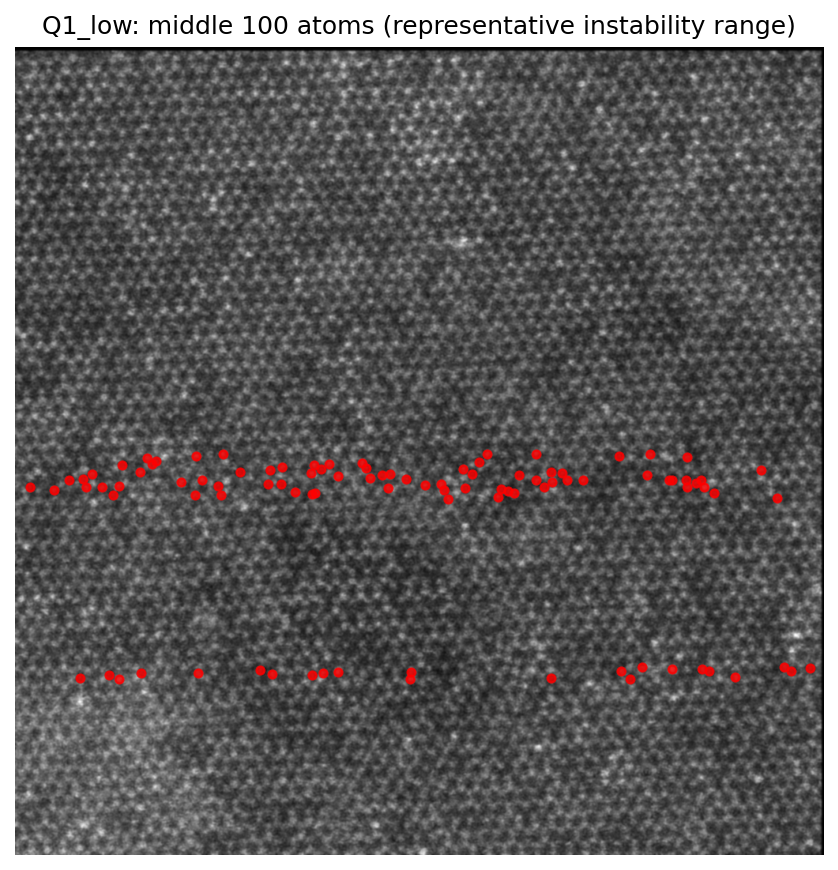

In [406]:
import numpy as np
import matplotlib.pyplot as plt
import os

# ---- choose how many representative atoms to display ----
N_rep = 100

# ---- build arrays ----
change_counts_arr = np.array(change_counts)  # (N_atoms,)
N_atoms = change_counts_arr.shape[0]

# ---- define quartile cutoffs (4 ranges) ----
q1, q2, q3 = np.quantile(change_counts_arr, [0.25, 0.50, 0.75])

# Range masks: low -> high instability
ranges = {
    "Q1_low":    (change_counts_arr <= q1),
    "Q2_midlow": ((change_counts_arr > q1) & (change_counts_arr <= q2)),
    "Q3_midhigh":((change_counts_arr > q2) & (change_counts_arr <= q3)),
    "Q4_high":   (change_counts_arr > q3),
}

print("Quartile thresholds:", "q1=", q1, "q2=", q2, "q3=", q3)
for k, m in ranges.items():
    print(k, "count:", int(m.sum()), "min/max:", int(change_counts_arr[m].min()), int(change_counts_arr[m].max()))

# ---- choose which range to visualize ----
range_name = "Q1_low"   # change to: Q1_low, Q2_midlow, Q3_midhigh, Q4_high
mask = ranges[range_name]
idx = np.where(mask)[0]

# sort atoms in this range by change_counts
idx_sorted = idx[np.argsort(change_counts_arr[idx])]

# select the "middle N_rep" atoms within this range
n_in_range = len(idx_sorted)
if n_in_range == 0:
    raise ValueError(f"No atoms in range {range_name}.")
if n_in_range < N_rep:
    print(f"Warning: range {range_name} has only {n_in_range} atoms; showing all of them.")
    rep_idx = idx_sorted
else:
    start = (n_in_range - N_rep) // 2
    rep_idx = idx_sorted[start:start + N_rep]

print(f"Selected {len(rep_idx)} representative atoms from {range_name} (middle of that range).")

# ---- plot representatives on frame 0 ----
plt.figure(figsize=(7,7), dpi=150)
plt.imshow(nIm[0], cmap="gray")

# plot points
for a in rep_idx:
    r, c = unique_atoms[a]
    plt.scatter(c, r, s=15, c="red", alpha=0.8)

plt.title(f"{range_name}: middle {len(rep_idx)} atoms (representative instability range)")
plt.axis("off")

# save to output folder if out_dir exists
if "out_dir" in globals():
    fpath = os.path.join(out_dir, f"representatives_{range_name}_middle{len(rep_idx)}.png")
    plt.savefig(fpath, bbox_inches="tight")
    print("Saved:", fpath)

plt.show()


Quartile thresholds: 1.0 3.0 5.0
Saved: results\3D_Stack_align1\representative_atoms_Q1_Q4.png


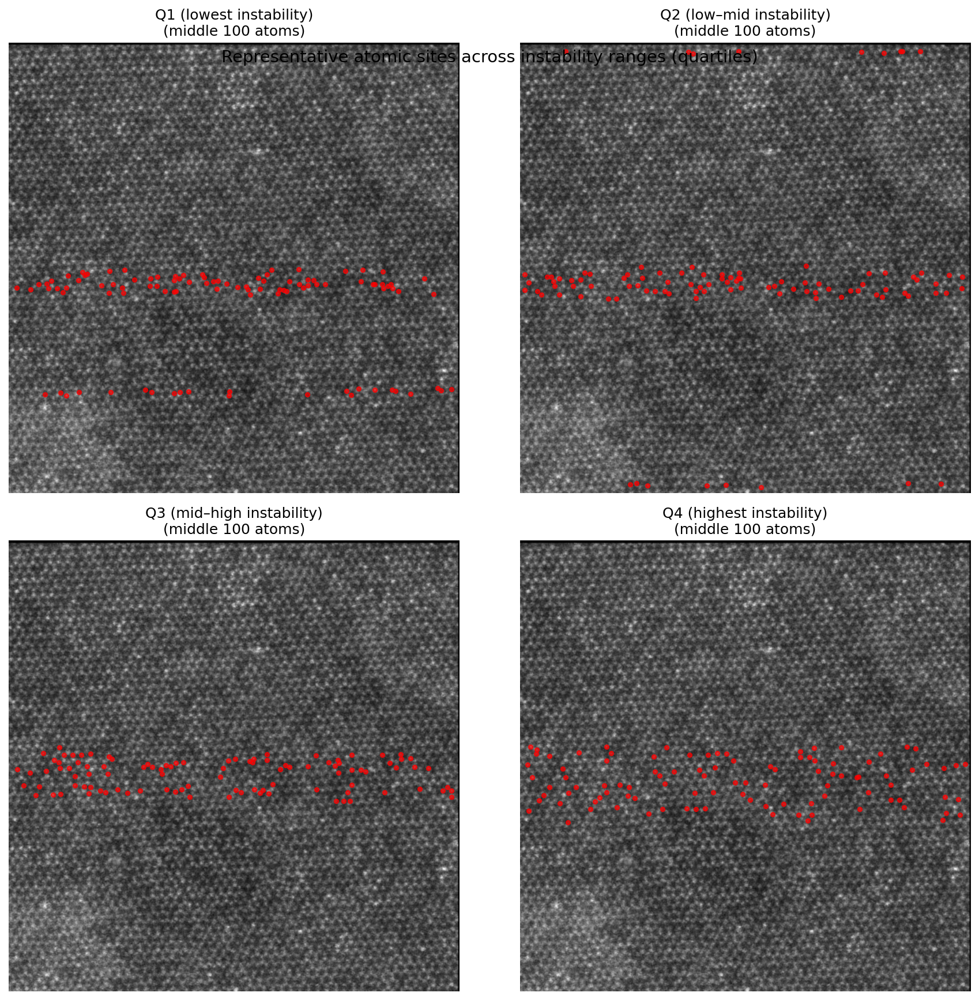

In [407]:
import numpy as np
import matplotlib.pyplot as plt
import os

# ----------------------------
# Parameters
# ----------------------------
N_rep = 100           # number of representative atoms per range
frame_ref = 0         # which frame to plot
cmap_points = "Reds"  # color style for points

# ----------------------------
# Prepare change count array
# ----------------------------
change_counts_arr = np.array(change_counts)
N_atoms = change_counts_arr.shape[0]

# Quartile thresholds
q1, q2, q3 = np.quantile(change_counts_arr, [0.25, 0.50, 0.75])

ranges = [
    ("Q1 (lowest instability)",    change_counts_arr <= q1),
    ("Q2 (low–mid instability)",   (change_counts_arr > q1) & (change_counts_arr <= q2)),
    ("Q3 (mid–high instability)",  (change_counts_arr > q2) & (change_counts_arr <= q3)),
    ("Q4 (highest instability)",   change_counts_arr > q3),
]

print("Quartile thresholds:", q1, q2, q3)

# ----------------------------
# Create figure
# ----------------------------
fig, axes = plt.subplots(2, 2, figsize=(12, 12), dpi=150)
axes = axes.ravel()

for ax, (title, mask) in zip(axes, ranges):

    idx = np.where(mask)[0]

    if len(idx) == 0:
        ax.set_title(title + " (no atoms)")
        ax.imshow(nIm[frame_ref], cmap="gray")
        ax.axis("off")
        continue

    # sort by change count
    idx_sorted = idx[np.argsort(change_counts_arr[idx])]

    # select middle N_rep atoms
    if len(idx_sorted) <= N_rep:
        rep_idx = idx_sorted
    else:
        start = (len(idx_sorted) - N_rep) // 2
        rep_idx = idx_sorted[start:start + N_rep]

    # plot background
    ax.imshow(nIm[frame_ref], cmap="gray")

    # plot representative atoms
    for a in rep_idx:
        r, c = unique_atoms[a]
        ax.scatter(c, r, s=12, c="red", alpha=0.7)

    ax.set_title(f"{title}\n(middle {len(rep_idx)} atoms)")
    ax.axis("off")

plt.suptitle(
    "Representative atomic sites across instability ranges (quartiles)",
    fontsize=14,
    y=0.92
)

plt.tight_layout()

# Save
if "out_dir" in globals():
    fpath = os.path.join(out_dir, "representative_atoms_Q1_Q4.png")
    plt.savefig(fpath, bbox_inches="tight")
    print("Saved:", fpath)

plt.show()


Total atoms: 8051
Unstable atoms: 6580
Saved: results\3D_Stack_align1\unstable_atoms_colored_low_to_high.png


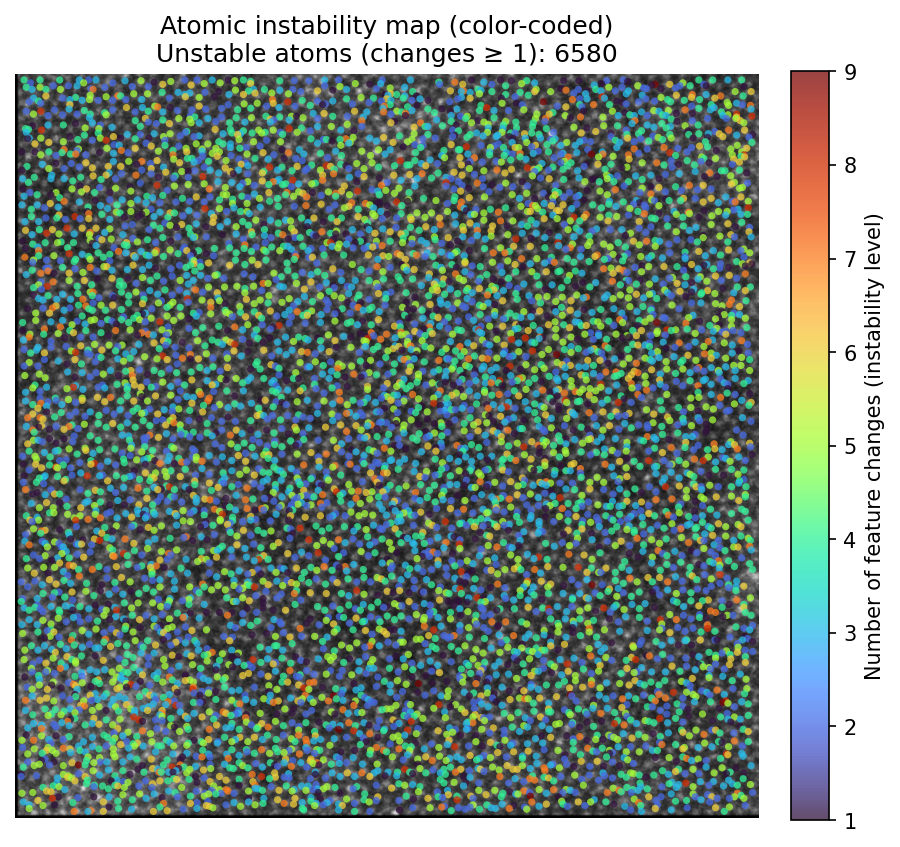

In [417]:
import numpy as np
import matplotlib.pyplot as plt
import os

# ----------------------------
# Parameters
# ----------------------------
frame_ref = 9          # which frame to show as background
min_changes = 1        # define "unstable"
point_size = 12
cmap = "turbo"       # perceptually uniform (good for heatmaps)

# ----------------------------
# Select unstable atoms
# ----------------------------
change_counts_arr = np.array(change_counts)
unstable_idx = np.where(change_counts_arr >= min_changes)[0]

print("Total atoms:", len(change_counts_arr))
print("Unstable atoms:", len(unstable_idx))

# Coordinates and values
xs = [unique_atoms[a][1] for a in unstable_idx]  # cols (x)
ys = [unique_atoms[a][0] for a in unstable_idx]  # rows (y)
vals = change_counts_arr[unstable_idx]

# ----------------------------
# Plot
# ----------------------------
plt.figure(figsize=(7,7), dpi=150)
plt.imshow(nIm[frame_ref], cmap="gray")

sc = plt.scatter(
    xs, ys,
    c=vals,
    cmap=cmap,
    s=point_size,
    alpha=0.75,
    linewidths=0
)

cbar = plt.colorbar(sc, fraction=0.046, pad=0.04)
cbar.set_label("Number of feature changes (instability level)")

plt.title(
    f"Atomic instability map (color-coded)\n"
    f"Unstable atoms (changes ≥ {min_changes}): {len(unstable_idx)}"
)
plt.axis("off")

# Save
if "out_dir" in globals():
    fpath = os.path.join(out_dir, "unstable_atoms_colored_low_to_high.png")
    plt.savefig(fpath, bbox_inches="tight")
    print("Saved:", fpath)

plt.show()


Instability bins: [ 1  1  2  3  4  5  6  7  8  9 10]
Level 1: no atoms
Saved: results\3D_Stack_align1\unstable_level_02_changes_1_1.png


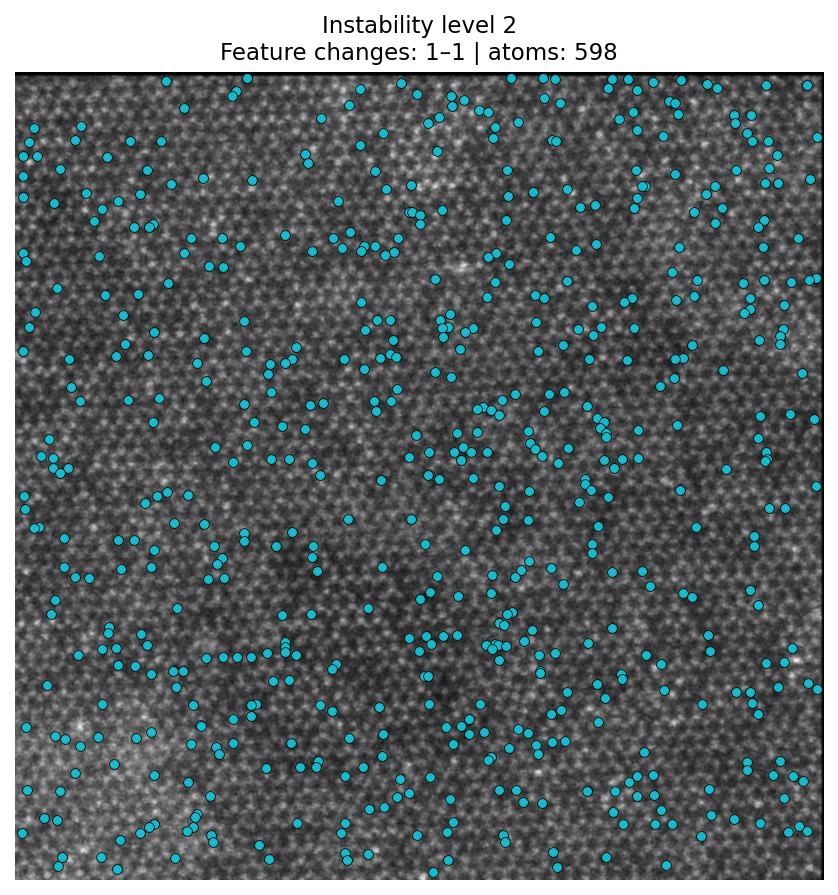

Saved: results\3D_Stack_align1\unstable_level_03_changes_2_2.png


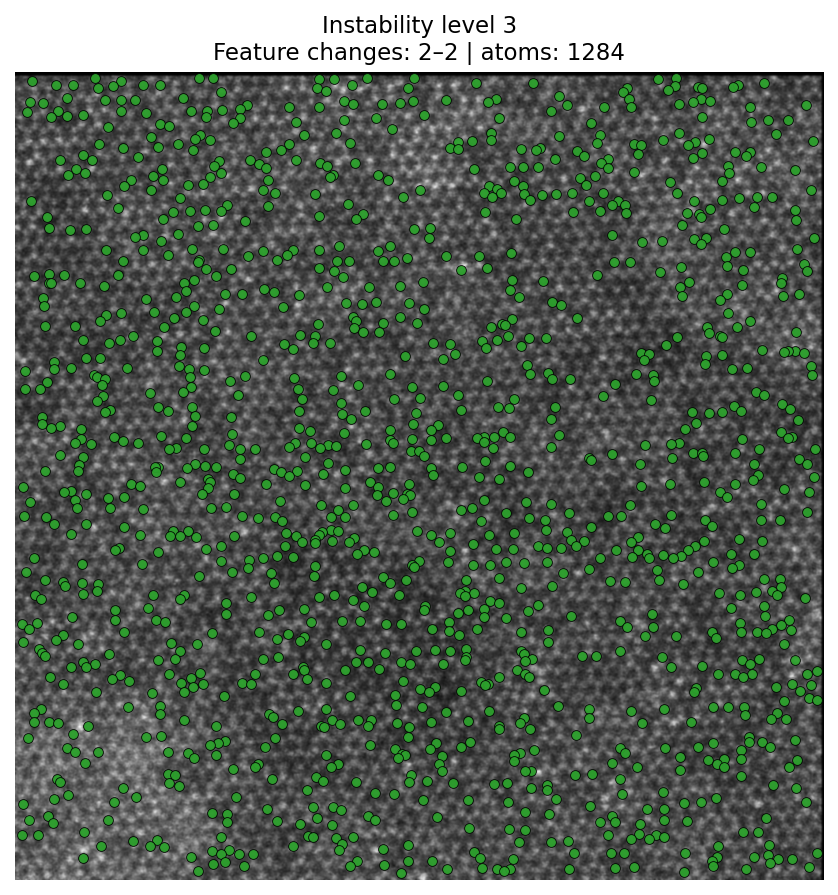

Saved: results\3D_Stack_align1\unstable_level_04_changes_3_3.png


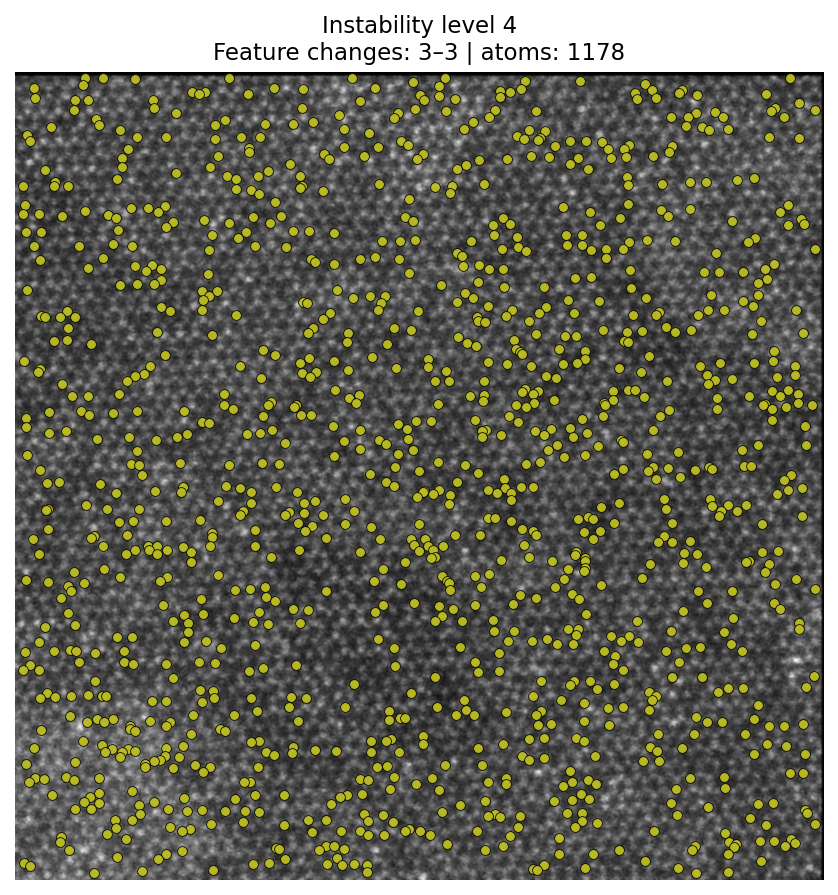

Saved: results\3D_Stack_align1\unstable_level_05_changes_4_4.png


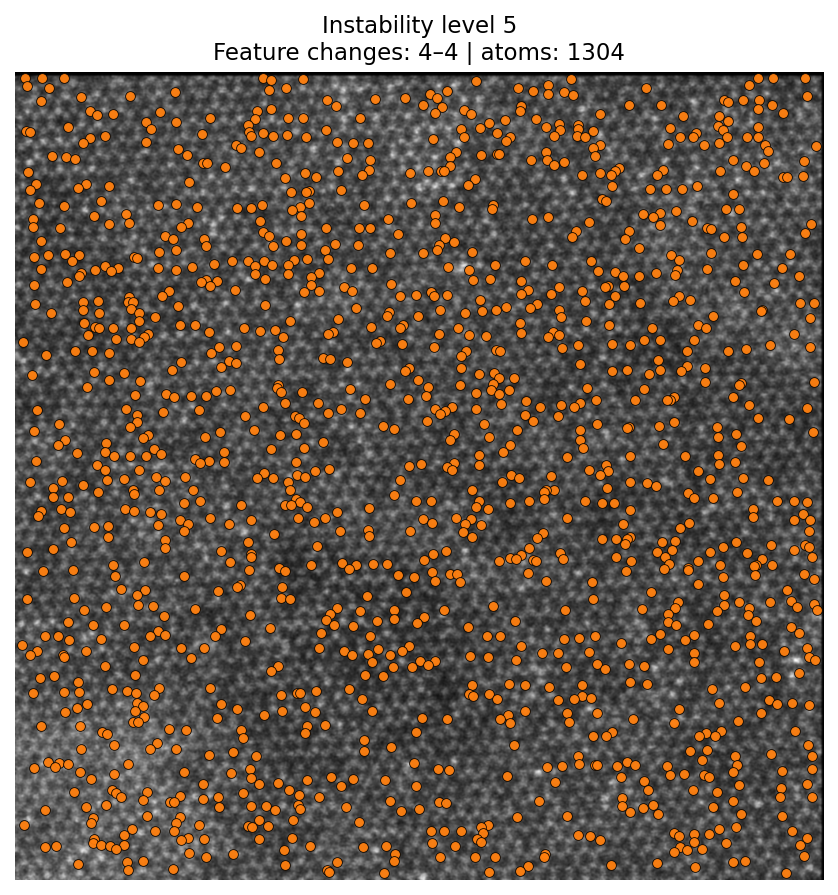

Saved: results\3D_Stack_align1\unstable_level_06_changes_5_5.png


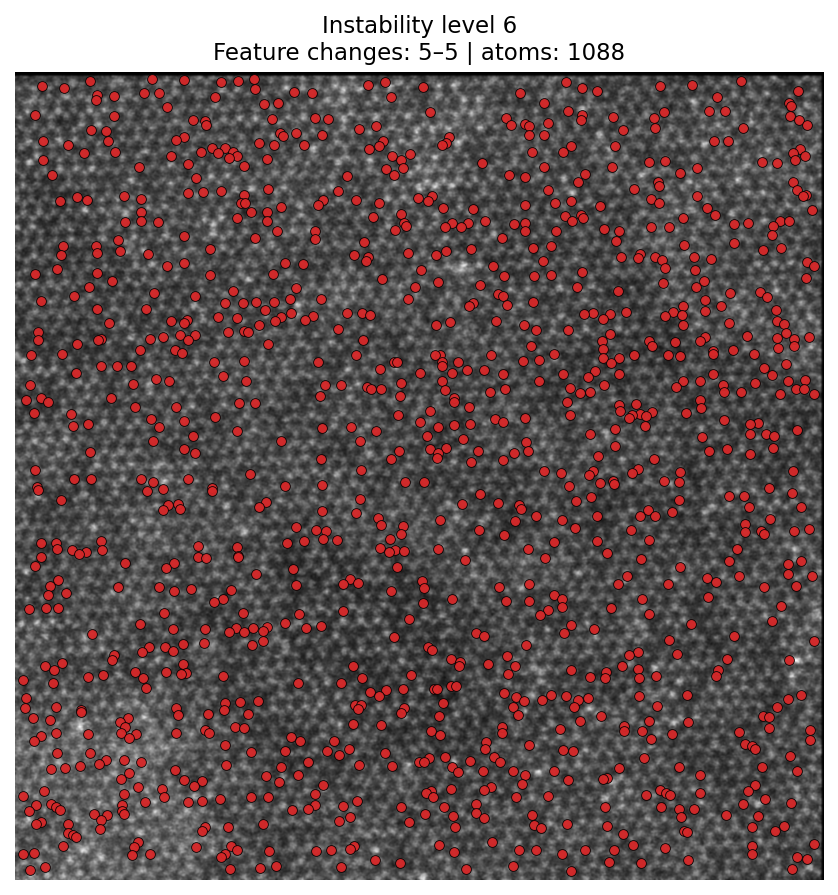

Saved: results\3D_Stack_align1\unstable_level_07_changes_6_6.png


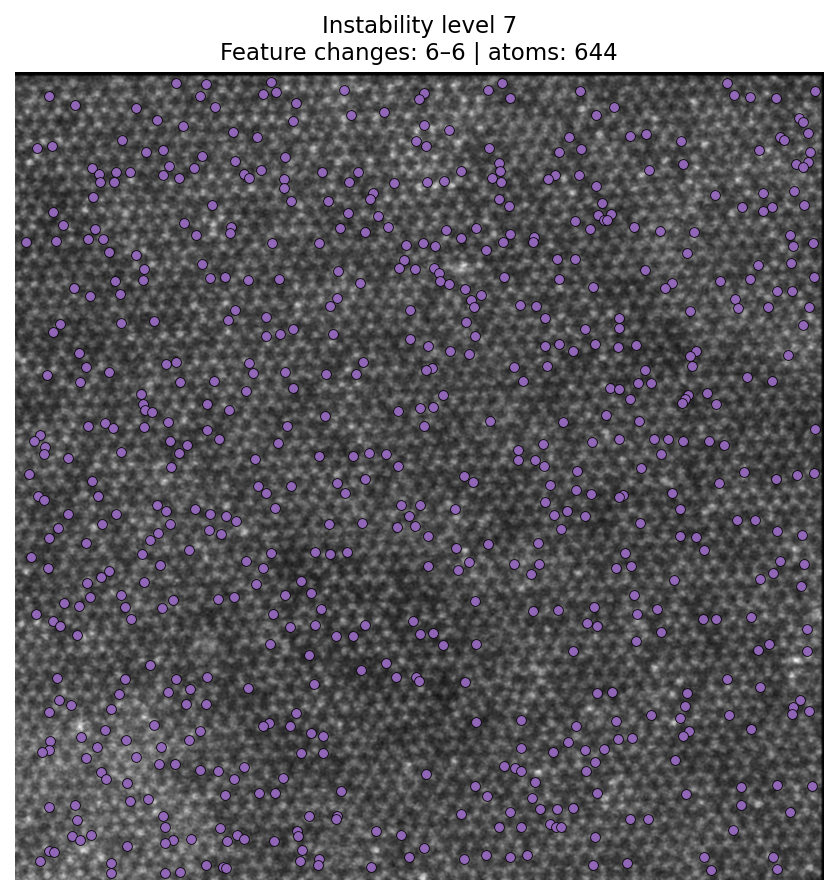

Saved: results\3D_Stack_align1\unstable_level_08_changes_7_7.png


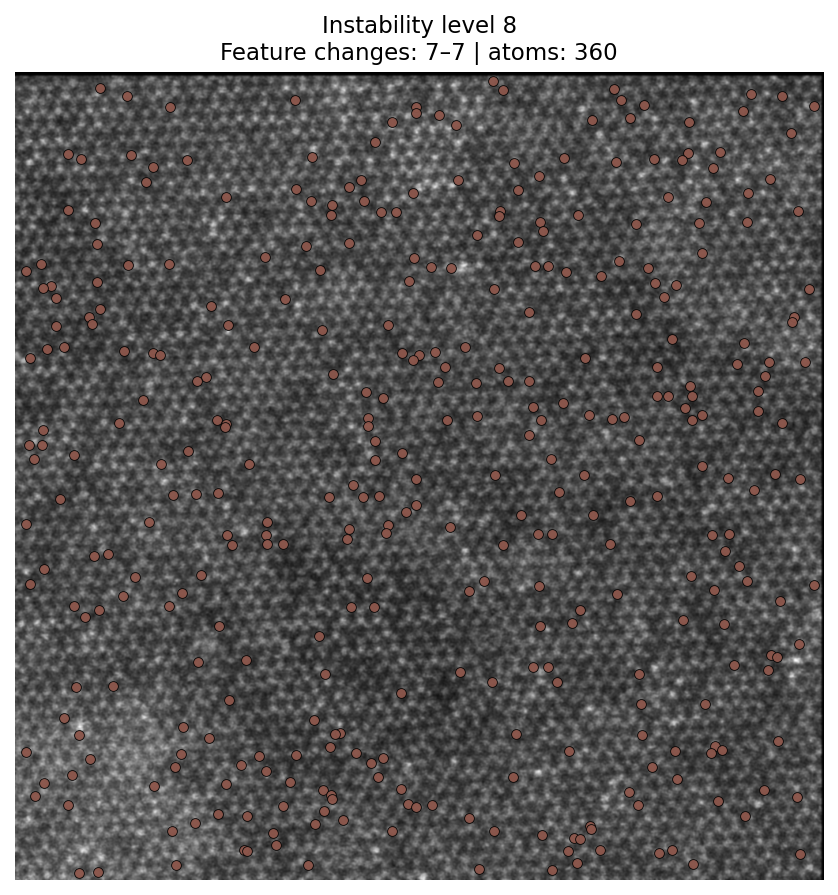

Saved: results\3D_Stack_align1\unstable_level_09_changes_8_8.png


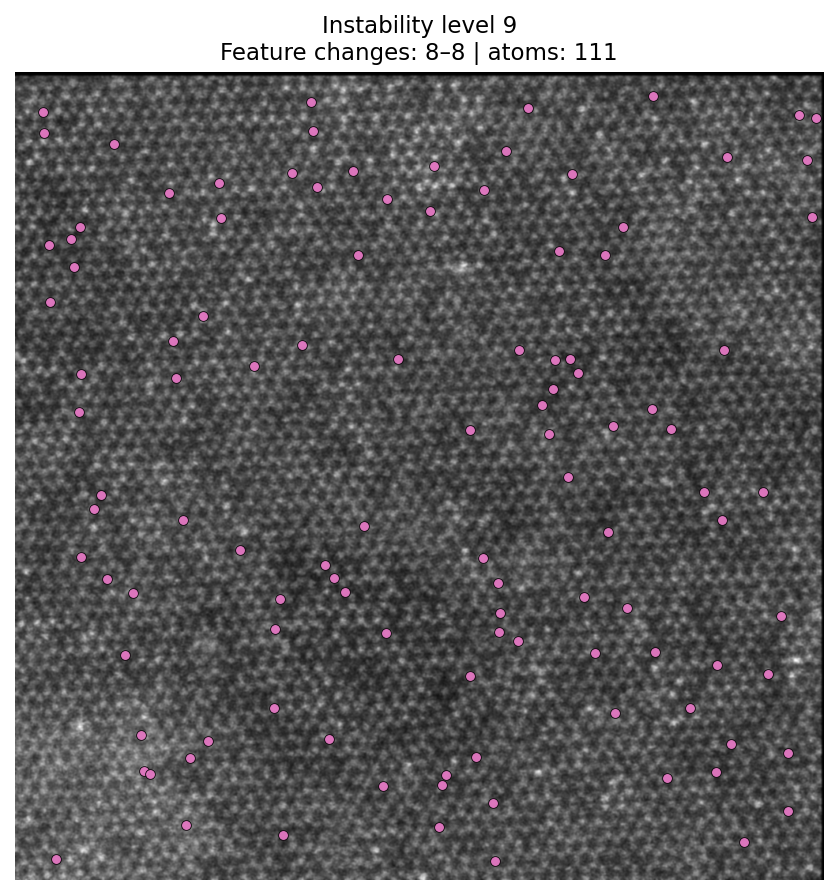

Saved: results\3D_Stack_align1\unstable_level_10_changes_9_9.png


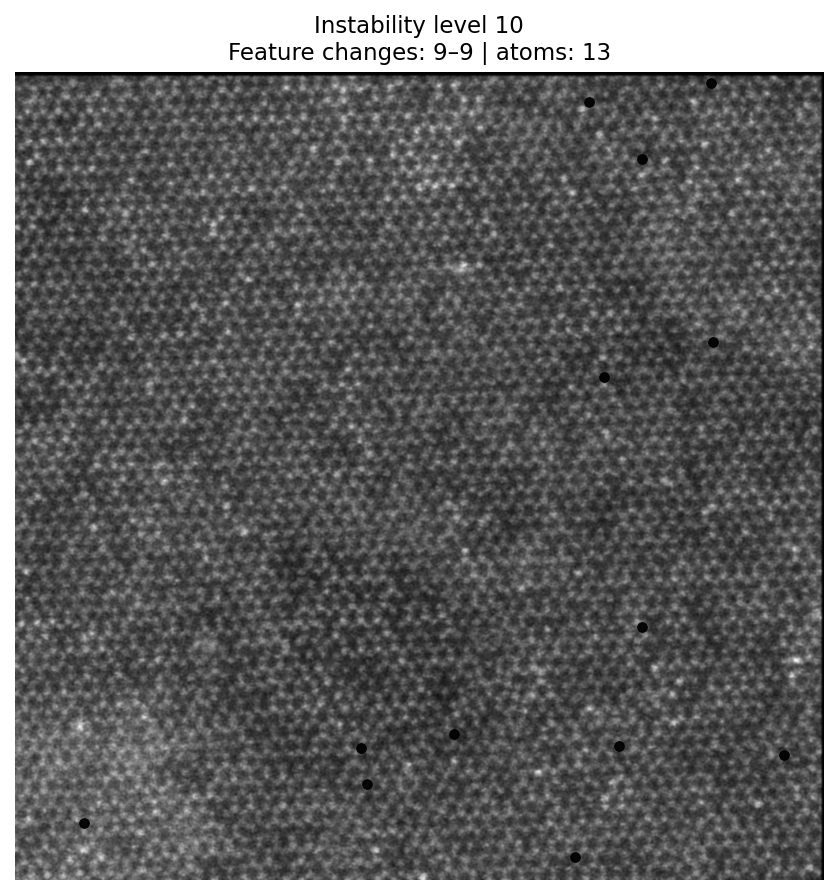

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os

# ----------------------------
# Parameters
# ----------------------------
frame_ref = 0
n_levels = 
point_size = 22

level_colors = [
    "#1f77b4", "#17becf", "#2ca02c", "#bcbd22", "#ff7f0e",
    "#d62728", "#9467bd", "#8c564b", "#e377c2", "#000000"
]

# ----------------------------
# Prepare data
# ----------------------------
change_counts_arr = np.array(change_counts)
max_change = change_counts_arr.max()

bins = np.linspace(1, max_change + 1, n_levels + 1, dtype=int)
levels = np.digitize(change_counts_arr, bins, right=False)
unstable_idx = np.where(change_counts_arr >= 1)[0]

print("Instability bins:", bins)

# ----------------------------
# Plot each level separately
# ----------------------------
for level in range(1, n_levels + 1):

    idx = unstable_idx[levels[unstable_idx] == level]
    if len(idx) == 0:
        print(f"Level {level}: no atoms")
        continue

    xs = [unique_atoms[a][1] for a in idx]
    ys = [unique_atoms[a][0] for a in idx]

    low = bins[level-1]
    high = bins[level] - 1

    plt.figure(figsize=(7,7), dpi=150)
    plt.imshow(nIm[frame_ref], cmap="gray")

    plt.scatter(
        xs, ys,
        s=point_size,
        c=level_colors[level-1],
        edgecolors="black",
        linewidths=0.4,
        alpha=0.95
    )

    plt.title(
        f"Instability level {level}\n"
        f"Feature changes: {low}–{high} | atoms: {len(idx)}",
        fontsize=11
    )
    plt.axis("off")

    if "out_dir" in globals():
        fname = f"unstable_level_{level:02d}_changes_{low}_{high}.png"
        fpath = os.path.join(out_dir, fname)
        plt.savefig(fpath, bbox_inches="tight")
        print("Saved:", fpath)

    plt.show()
